[Peeters, 2005](http://recherche.ircam.fr/anasyn/peeters/ARTICLES/Peeters_2005_ISMIR_RhythmClassification.pdf)
[Prockup, 2015](http://music.ece.drexel.edu/files/Prockup2015a.pdf)

In [15]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import scipy.interpolate

In [2]:
from IPython.display import Audio

In [119]:
from matplotlib import rc, rcParams
rcParams['text.latex.preamble'] = [r'\usepackage{harmony}', r'\usepackage{stackengine}']
rc('text', usetex=True)

In [4]:
def tempogram_ratio(tgram, sr=22050, hop_length=512, start_bpm=120.0, std_bpm=1):
    
    # each row of tempogram is a lag of hop_length / sr
    times = 60 * (sr / 512.) / np.arange(0, len(tgram))
    
    # estimate per-frame tempo
    window = np.exp(-0.5 * ((np.log2(times / start_bpm)) / std_bpm)**2)
    window[0] = 0
    
    win_tg = tgram * window[:, np.newaxis]
    
    local_tempo = win_tg.argmax(axis=0)
        
    ref_strength = tgram[local_tempo, range(len(local_tempo))]
    
    # construct an interpolator on the y-axis
    f = scipy.interpolate.RectBivariateSpline(np.arange(tgram.shape[0]),
                                              np.arange(tgram.shape[1]),
                                              tgram,
                                              kx=2,
                                              ky=1)
    out = []

    for factor in [1./3 * 2./32, 4./32, 6./32,  # 32nds
                   1./3 * 2./16, 4./16, 6./16,  # 16ths
                   1./3 * 2./8,  4./8,  6./8,   # 8ths
                   1./3 * 2./4,  4./4,  6./4,   # 4ths
                   1./3 * 2./2,  4./2,  6./2,   # 2nds
                   1./3 * 2./1,  4./1,  6./1]:  # 1sts
        
        out.append(f.ev(local_tempo / factor, np.arange(len(local_tempo))))
    
    # Only normalize if there's enough energy
    ref_strength[ref_strength < 1e-2] = 1
    
    out = np.asarray(out) / ref_strength[np.newaxis, :]
    
    return np.maximum(out, 0.0) # correct for interpolation errors

In [103]:
#y, sr = librosa.load(librosa.util.example_audio_file())
y, sr = librosa.load('/media/bmcfee/31892bae-2481-425a-836f-5d503baa3bdb/salami-data-public/audio/636/audio.mp3')

In [104]:
# Use a superflux onset
oenv = librosa.onset.onset_strength(y=y, sr=sr, max_size=5)

In [105]:
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)

In [106]:
# De-trend, clip, and renormalize
tgf = librosa.util.normalize(np.maximum(0.0, tempogram - scipy.ndimage.median_filter(tempogram, size=(9, 1))))

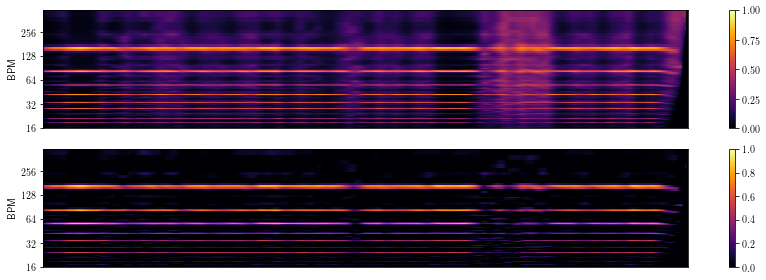

In [107]:
plt.figure(figsize=(12, 4))
plt.subplot(2,1,1)
librosa.display.specshow(tempogram[:160], y_axis='tempo', cmap='inferno')
plt.colorbar()

plt.subplot(2,1,2)
librosa.display.specshow(tgf[:160], y_axis='tempo', cmap='inferno')
plt.colorbar()

plt.tight_layout()

In [108]:
tr = librosa.util.normalize(tempogram_ratio(tgf))

/home/bmcfee/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


In [109]:
fm = librosa.fmt(tgf, n_fmt=256, axis=0)

/home/bmcfee/git/librosa/librosa/core/spectrum.py:1008: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


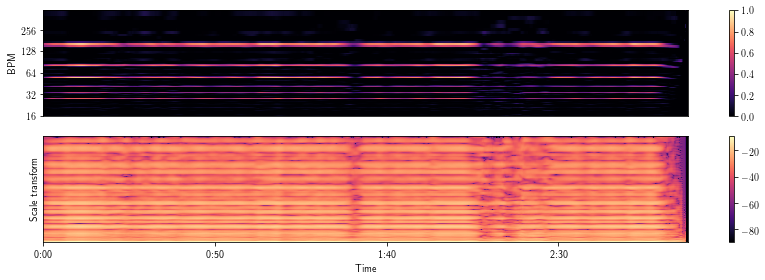

In [110]:
plt.figure(figsize=(12, 4))
plt.subplot(2,1,1)
librosa.display.specshow(tgf[:160], y_axis='tempo', cmap='magma')
plt.colorbar()

plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(fm), cmap='magma', x_axis='time')
plt.ylabel('Scale transform')
plt.colorbar()
plt.tight_layout()

In [126]:
NOTE_MARKERS = [r'\stackunder{\Zwdr}{$3$}~~', r'\Zwdr~~', r'\Zwdr\Pu~',
                r'\stackunder{\Sech}{$3$}~~', r'\Sech~~', r'\Sech\Pu~',
                r'\stackunder{\Acht}{$3$}~~', r'\Acht~~', r'\Acht\Pu~',
                r'\stackunder{\Vier}{$3$}~~', r'\Vier~~', r'\Vier\Pu~',
                r'\stackunder{\Halb}{$3$}~~', r'\Halb~~', r'\Halb\Pu~',
                r'\stackunder{\Ganz}{$3$}~~', r'\Ganz~~',  r'\Ganz\Pu~']

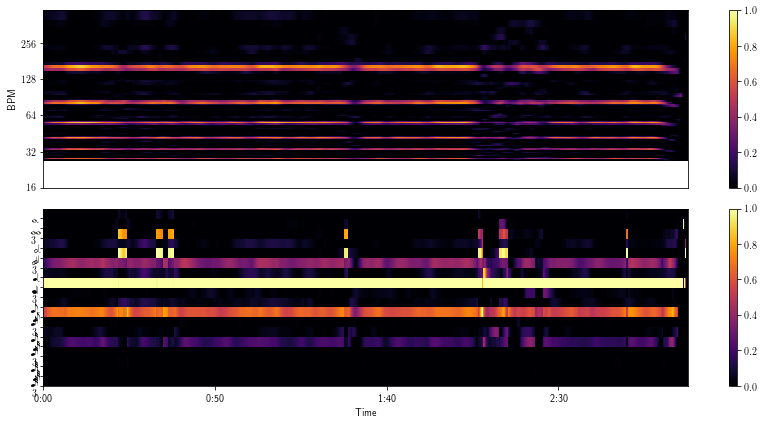

In [127]:
plt.figure(figsize=(12, 6))
plt.subplot(2,1,1)
librosa.display.specshow(tgf[:96], cmap='inferno', y_axis='tempo')
plt.colorbar()

plt.subplot(2,1,2)
librosa.display.specshow(tr, cmap='inferno', x_axis='time')
plt.colorbar()

plt.yticks(np.arange(len(tr)), NOTE_MARKERS)
plt.tight_layout()

In [113]:
Audio(data=y, rate=sr)

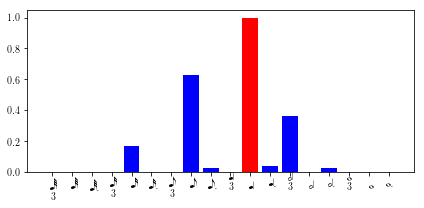

In [128]:
plt.figure(figsize=(6,3))
bar_colors = ['b'] * len(tr)
bar_colors[10] = 'r'
plt.bar(range(len(tr)), np.median(tr, axis=1),
        tick_label=NOTE_MARKERS,
        color=bar_colors,
        align='center')
plt.axis('tight')
plt.tight_layout()

In [115]:
est_tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr)

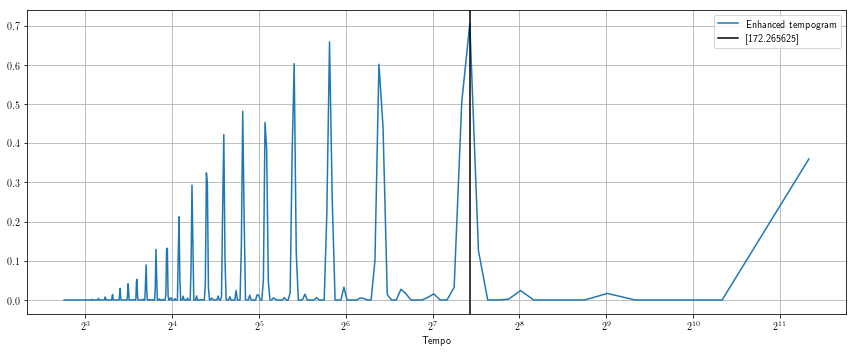

In [116]:
plt.figure(figsize=(12, 5))

plt.semilogx(librosa.tempo_frequencies(len(tgf))[1:],
             np.median(tgf, axis=1)[1:],
             label='Enhanced tempogram', basex=2)

plt.xlabel('Tempo')
plt.grid()
plt.axvline(est_tempo, color='k', label=est_tempo)
plt.legend(loc='best')
plt.tight_layout()